<a href="https://colab.research.google.com/github/YenaChoi00/Machine-Learning/blob/main/Object_Detection_HardhatDS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 안전모 탐지 모델

### 데이터셋 다운로드

* 안전모 데이터셋: https://public.roboflow.com/object-detection/hard-hat-workers

In [ ]:
# yoloyv5 모델 다운로드
!git clone https://github.com/ultralytics/yolov5
%cd /content/yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

Cloning into 'yolov5'...
remote: Enumerating objects: 15697, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 15697 (delta 6), reused 14 (delta 4), pack-reused 15672
Receiving objects: 100% (15697/15697), 14.48 MiB | 9.59 MiB/s, done.
Resolving deltas: 100% (10747/10747), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.5/586.5 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.1/205.1 kB 22.5 MB/s eta 0:00:00


In [ ]:
# 디렉토리 생성 및 데이터셋 다운로드
%mkdir /content/yolov5/hardhat
%cd /content/yolov5/hardhat
!curl -L "https://public.roboflow.com/ds/2JpujYQG80?key=GEK5qpZzcZ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/labels/000605_jpg.rf.0c32e7a0bc3cb35efb487e563bd531d2.txt  
 extracting: train/labels/000343_jpg.rf.0c2f20c5673eb0132c8f6d63906c5f2d.txt  
 extracting: train/labels/004238_jpg.rf.0c3465deac398afe856c752cc9d98852.txt  
 extracting: train/labels/004029_jpg.rf.0c5c615d8dc20133e108e813eca4234a.txt  
 extracting: train/labels/002532_jpg.rf.0cc8d54d2b360fa57e5402d53edae103.txt  
 extracting: train/labels/001680_jpg.rf.0c5c6aceea85a79a7a2404a54a6edc68.txt  
 extracting: train/labels/000015_jpg.rf.0c0cedbd11befb87888bc8887dca5a52.txt  
 extracting: train/labels/004978_jpg.rf.0cd5eb9b3507044f9cdcc2f2abee4f0b.txt  
 extracting: train/labels/002500_jpg.rf.0c525ff7b9202f6ed81fbcc8a1ce7831.txt  
 extracting: train/labels/003833_jpg.rf.0c6929cb9362e0f95beed22139bcb644.txt  
 extracting: train/labels/002127_jpg.rf.0a642389755589a074e3a2e35c8f4d0f.txt  
 extracting: train/labels/005215_jpg.rf.0c3bc4a4b40f03461eb7ae77a252210a.txt  
 extracting: tra

In [ ]:
# 데이터셋 경로 리스트 변수로 저장
from glob import glob

train_img_list = glob('/content/yolov5/hardhat/train/images/*.jpg')
test_img_list = glob('/content/yolov5/hardhat/test/images/*.jpg')
print(len(train_img_list), len(test_img_list))

5269 1766


In [ ]:
# test 데이터를 나눠서 validation 용 데이터 만들기
from sklearn.model_selection import train_test_split

test_img_list, val_img_list = train_test_split(test_img_list, test_size=0.5, random_state=777)
print(len(test_img_list), len(val_img_list))

883 883


In [ ]:
# validation
import yaml

with open('/content/yolov5/hardhat/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list)+'\n')
with open('/content/yolov5/hardhat/test.txt', 'w') as f:
  f.write('\n'.join(test_img_list)+'\n')
with open('/content/yolov5/hardhat/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list)+'\n')

In [ ]:
# 문장을 텍스트처럼 쓸 때 필요한 magic 모듈 정의
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [ ]:
# 데이터 구성 정의
%cat /content/yolov5/hardhat/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
# (validation 데이터도 test 폴더 하위에 있다.)
%%writetemplate /content/yolov5/hardhat/data.yaml

train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
%cat /content/yolov5/hardhat/data.yaml


train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']


# 모델 구성

In [ ]:
with open('data.yaml', 'r') as stream:
  num_classes=str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [ ]:
# 모델 지정 - 클래스 갯수 변경해줌
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

### 학습(Training)

* `img`: 입력 이미지 크기 정의
* `batch`: 배치 크기 결정
* `epochs`: 학습 기간 개수 정의
* `data`: yaml 파일 경로
* `cfg`: 모델 구성 지정
* `weights`: 가중치에 대한 경로 지정
* `name`: 결과 이름
* `nosave`: 최종 체크포인트만 저장
* `cache`: 빠른 학습을 위한 이미지 캐시

In [ ]:
# 학습
%time
%cd /content/yolov5
!python train.py --img 416 --batch 32 --epochs 50 --data ./hardhat/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name hardhat_results --cache

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs
/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./hardhat/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=hardhat_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-169-geef637c Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05,

In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
!ls runs/train/hardhat_results3

confusion_matrix.png				    results.png
events.out.tfevents.1684738812.658b7099eada.7114.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


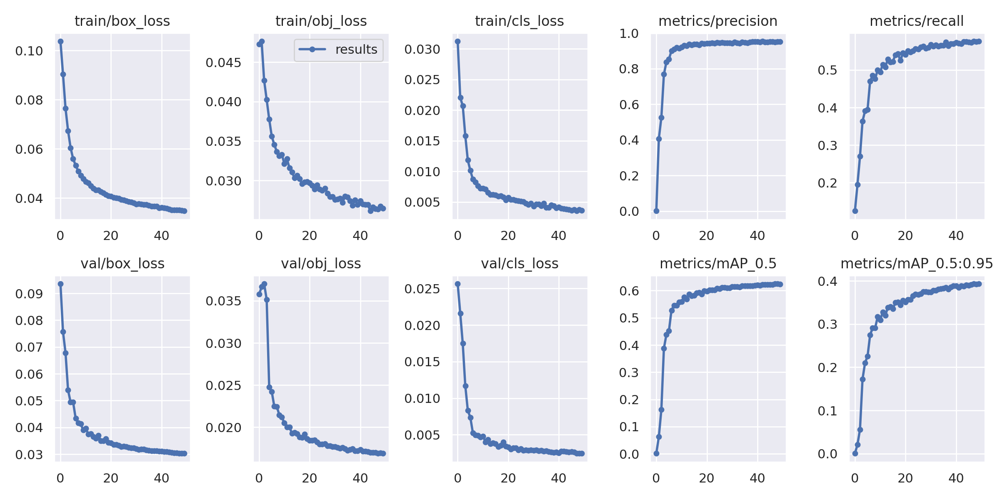

In [19]:
Image(filename='runs/train/hardhat_results3/results.png', width=1000)

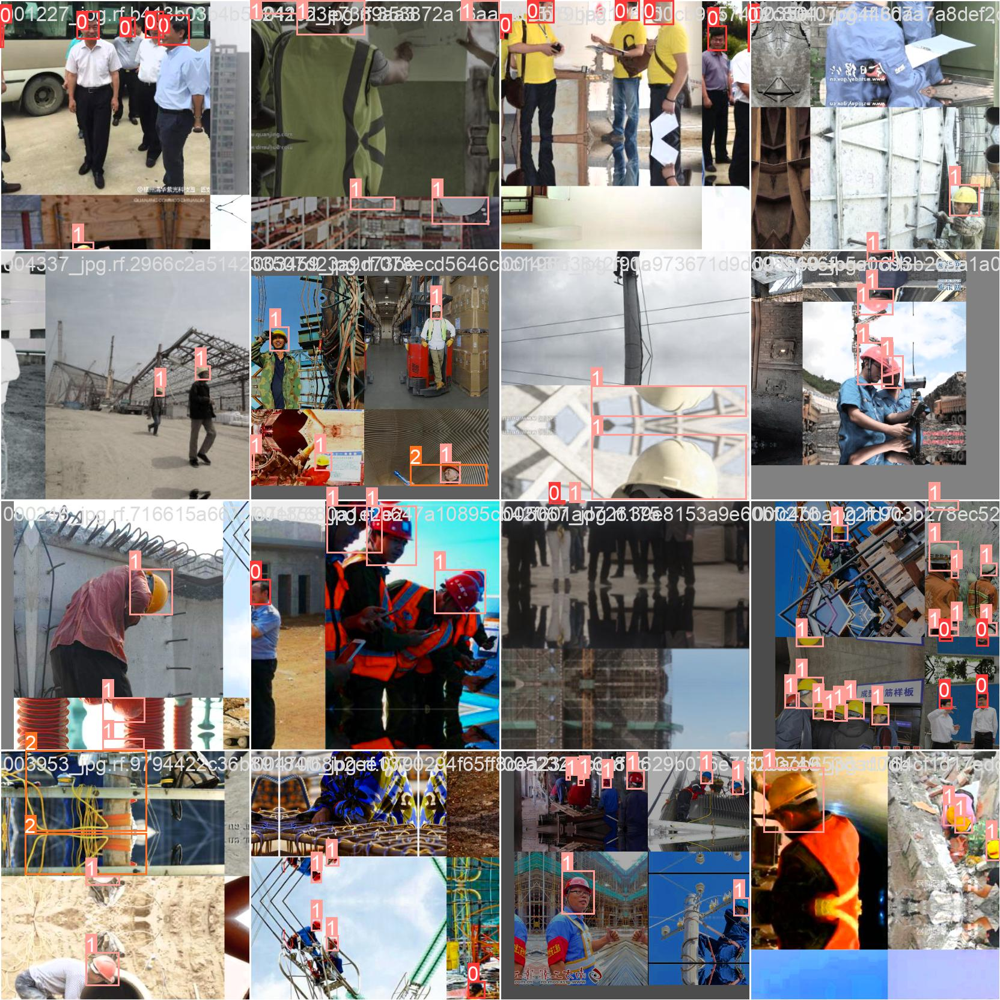

In [21]:
Image(filename='runs/train/hardhat_results3/train_batch0.jpg', width=1000)

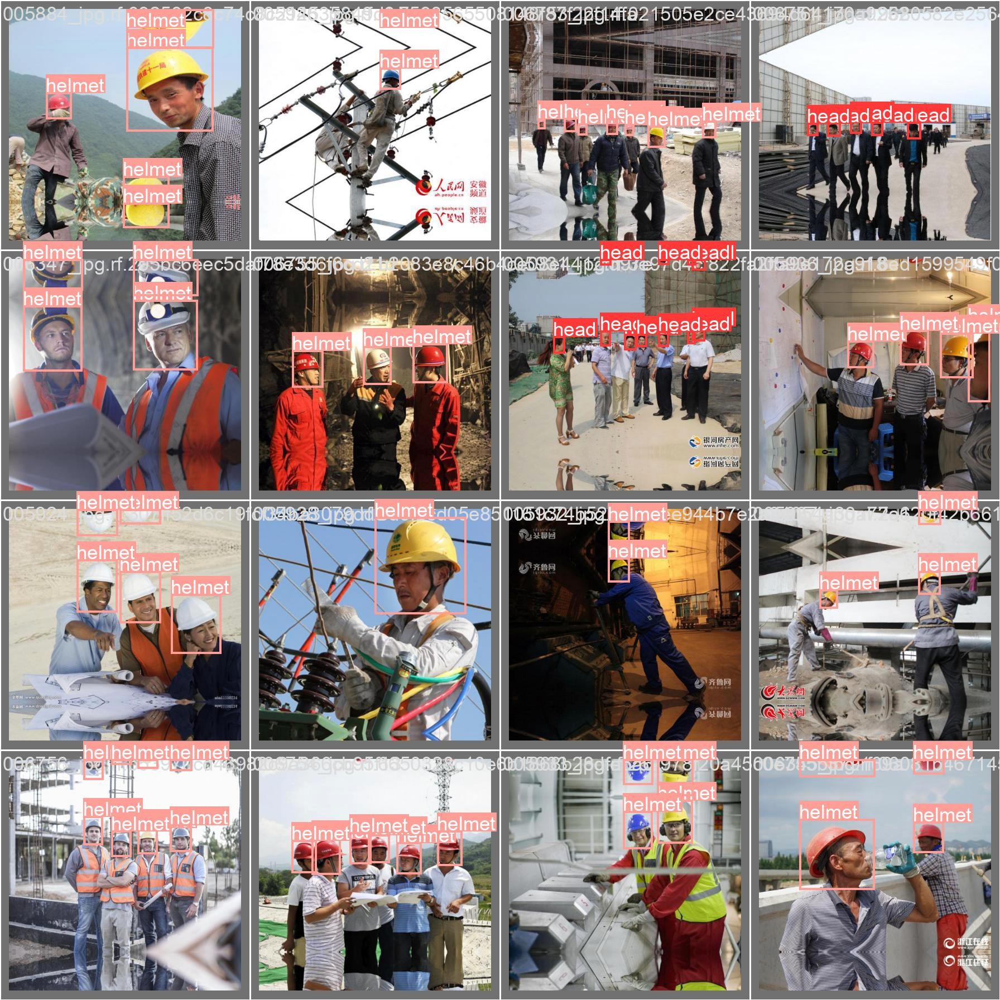

In [22]:
Image(filename='runs/train/hardhat_results3/val_batch0_labels.jpg', width=1000)

# 검증 (validation)

In [23]:
!python val.py --weights runs/train/hardhat_results3/weights/best.pt --data ./hardhat/data.yaml --img 416 --iou 0.65 --half

val: data=./hardhat/data.yaml, weights=['runs/train/hardhat_results3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-169-geef637c Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/hardhat/test/labels.cache... 1766 images, 0 backgrounds, 0 corrupt: 100% 1766/1766 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 56/56 [00:22<00:00,  2.54it/s]
                   all       1766       8915      0.951      0.574      0.623      0.394
                  head       1766       2208      0.908      0.857      0.909      0.571
     

In [24]:
!python val.py --weights runs/train/hardhat_results3/weights/best.pt --data ./hardhat/data.yaml --img 416 --task test

val: data=./hardhat/data.yaml, weights=['runs/train/hardhat_results3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-169-geef637c Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/yolov5/hardhat/test/labels.cache... 1766 images, 0 backgrounds, 0 corrupt: 100% 1766/1766 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 56/56 [00:22<00:00,  2.49it/s]
                   all       1766       8915       0.95      0.577      0.625      0.394
                  head       1766       2208      0.909      0.863      0.911      0.571
   

# 추론 (Inference)

In [25]:
%ls runs/train/hardhat_results3/weights

best.pt  last.pt


In [28]:
!python detect.py --weights runs/train/hardhat_results3/weights/best.pt --img 416 --conf 0.4 --source ./hardhat/test/images

detect: weights=['runs/train/hardhat_results3/weights/best.pt'], source=./hardhat/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-169-geef637c Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1766 /content/yolov5/hardhat/test/images/005298_jpg.rf.7d1070e4a462d4c636a68e64f2013761.jpg: 416x416 7 helmets, 9.3ms
image 2/1766 /content/yolov5/hardhat/test/images/005299_jpg.rf.a79cacc62cdd99ad871cf1786ad865ff.jpg: 416x416 1 helmet, 7.4ms
image 3/1766 /content/yolov5/hardhat/test/images/005300_jpg.rf.419d88422

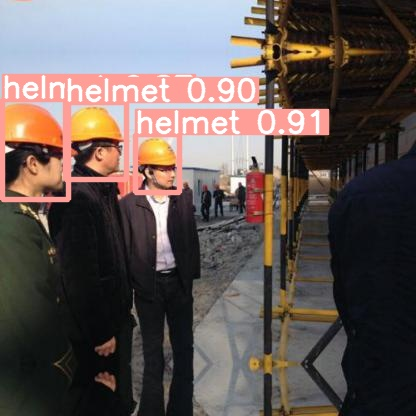

In [35]:
# 랜덤으로 선택해서 확인

import glob
import random

image_name = random.choice(glob.glob('runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

# 모델 내보내기

In [36]:
# 구글 드라이브와 연동
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [40]:
%mkdir /content/drive/My\ Drive/hardhat/
%cp runs/train/hardhat_results3/weights/best.pt /content/drive/My\ Drive/hardhat/

mkdir: cannot create directory ‘/content/drive/My Drive/hardhat/’: File exists
